In [9]:
import scvi
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
 

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [10]:
sc.logging.print_versions()




-----
anndata     0.10.7
scanpy      1.10.1
-----
PIL                 10.3.0
absl                NA
asttokens           NA
attr                23.2.0
chex                0.1.86
comm                0.2.2
contextlib2         NA
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.1
decorator           5.1.1
docrep              0.3.2
etils               1.9.1
executing           2.0.1
filelock            3.14.0
flax                0.8.4
fsspec              2024.6.0
h5py                3.11.0
igraph              0.11.8
ipykernel           6.29.4
jax                 0.4.35
jax_cuda12_plugin   NA
jax_plugins         NA
jaxlib              0.4.34
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
leidenalg           0.10.2
lightning           2.1.4
lightning_utilities 0.11.2
llvmlite            0.43.0
matplotlib          3.9.0
ml_collections      NA
ml_dtypes           0.4.0
mpl_toolkits   

### Max usage here 170gb. 
### Assumes GPU available for scanVI (but could do pre-processing (highest mem requirement}), then use smaller resources with GPU for integration)

# Load reference map (~60gb)

In [3]:
"""

# dataset is available here (choose scRNA_seq)
https://cellatlas.io/studies/skin-fibroblast#resources

PUT THE PATH TO THE REFERENCE ADATA HERE, AND THEN LOAD

"""

#adata_reference_path = '/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final.filtered.scrna.clean'
adata_reference_path = '/nfs/team298/ls34/fibroblast_atlas_paper/final_adatas_chloecolours/adata_lesional11.h5ad'

adata=sc.read_h5ad(adata_reference_path)
adata.obs["lvl5_annotation"]=adata.obs["test13"]
adata

'\nHere we assume scRNA-seq data is being used. With Xenium data, higher-resolution annotations seemed to be achieved by mapping to scRNA-seq data also.\n\n# dataset is available here (choose scRNA_seq)\nhttps://cellatlas.io/studies/spatial-skin-atlas\n\n'

# Prepare your data

In [4]:
"""
### add path to your adata here. 

"""
#adata_tomap_path = '/nfs/team361/ls34/inflow/final_adatas/adata_mm_ctcl_fbs.h5ad'
adata_tomap_path = '/lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output//SpatialSkinAtlasMapping_scanviSpatialSkinAtlasMapping_HS_HVGNUMBER1905__MAXEPOCHS20__BATCHKEYsample_id/adata_HSxeniumonly_highq.h5ad'
# adata_hs = sc.read_h5ad(PATH)
# adata_hs
adata_tomap=sc.read_h5ad(adata_tomap_path)
adata_tomap.shape

(182263, 4994)

In [5]:
adata_tomap

AnnData object with n_obs × n_vars = 182263 × 4994
    obs: 'sample_id', 'barcode', 'GSE', 'Site_status', 'Patient_status', 'Location', 'Age', 'Sex', 'dataset_id', 'lvl5_annotation', 'atlas_status', 'atlas_status_reynolds', 'Timepoint', 'info_id6', 'tech', 'scanvi_predictions2', 'lvl1_new', 'Site_status_binary2', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id_dir', 'patient_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'Mapping_status', 'scanvi_predictions', 'broad_annotation'
    uns: 'broad_annotation_colors', 'neighbor_20', 'umap'
    obsm: 'X_scanvi', 'X_scvi', 'X_umap', 'spatial'


In [6]:
"""
check counts data
"""
try:
    print(adata_tomap.X[:10,:10].A)
except:
    print(adata_tomap.X[:10,:10].todense())
print("check this is counts data")

[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 2. 0. 0. 0.]
 [0. 0. 0. 0. 0. 2. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
check this is counts data


In [8]:
# restrict mapping dataset to just fibroblasts
#adata_tomap=adata_tomap[adata_tomap.obs["scanvi_predictions"].str.startswith("F")].copy()
#adata_tomap.obs.scanvi_predictions.value_counts()

scanvi_predictions
F2: Universal                     29363
F1: Superficial                   17602
F4: DS_DPEP1+                      5378
F3: FRC-like                       1853
F2/3: Perivascular                 1532
F4: TNN+COCH+                      1399
F5: RAMP1+                          826
F5: NGFR+                           286
F4: DP_HHIP+                         22
F6: Inflammatory myofibroblast        9
Name: count, dtype: int64

In [9]:
"""
We assume data to map is unlabelled
"""
adata_tomap.obs["lvl5_annotation"] = "New/unlabelled/excluded"

In [10]:
"""
SET SAMPLE ID COLUMN FROM YOUR DATA
"""
#adata_tomap.obs["sample_id"] = adata_tomap.obs["orig.ident"]
adata_tomap.obs["sample_id"].value_counts()


sample_id
output-XETG00055__0051506__DG38-SKI-0-FFPE-2-S2__20250724__133352    14211
output-XETG00055__0051431__DG16-SKI-0-FFPE-1-S2__20250724__133352    14068
output-XETG00055__0051431__DG18-SKI-0-FFPE-1-S2__20250724__133352    13200
Melanoma                                                             12321
output-XETG00335__0043857__AX21-SKI-0-FFPE-1-S7__20250227__123312     6076
output-XETG00335__0043857__AX21-SKI-0-FFPE-1-S8__20250227__123313     5442
output-XETG00055__0051431__DG21-SKI-0-FFPE-1-S2__20250724__133352     5366
output-XETG00055__0051506__DG41-SKI-0-FFPE-1-S2__20250724__133352     4488
output-XETG00055__0051506__DG39-SKI-0-FFPE-1-S2__20250724__133352     3856
output-XETG00055__0051506__DG45-SKI-0-FFPE-2-S2__20250724__133352     3740
output-XETG00335__0043873__AX9-SKI-0-FFPE-1-S10__20250227__123313     3323
output-XETG00335__0043857__AX10-SKI-0-FFPE-1-S7__20250227__123313     3093
output-XETG00055__0051431__DG19-SKI-0-FFPE-1-S2__20250724__133352     2581
output-XETG0005

In [11]:
assert "sample_id" in adata_tomap.obs.columns, "ERROR: adata.obs does not contain 'sample_id'"
# adata.obs["sample_id"] = adata.obs[PUT NAME OF SAMPLE ID COLUMN HERE]


In [12]:
"""
SET PATH TO SAVE OUTPUT AND NAME OF DATASET
"""
# base dir where model output saves + preintegration adata saves
BASE = '/lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output/'
DATASET="HS_FBs"


adata_path =  BASE + f'adata_{DATASET}_and_FBATLAS_preintegration.h5ad'


In [13]:
"""
For xenium mapping, we change to 10 latent and 1 layer, and reduced HVG number

# if mapping xenium, consider adding "technology" as a categorical covariate (i.e. xenium vs scrna)
# with xenium, we have only mapped 5k data. I suspect performance not as good with smaller panels

"""

N_LATENT=10
N_LAYERS=1
NEIGHBOR=20
MIN_DIST=0.1
HVG_BATCH_KEY = "sample_id"
HVG_NUMBER = 2000
run_scanvi=True # if false, will run scvi
SCANVI_LABELS_KEY="lvl5_annotation" # this is where cell type annotations are stored for SpatialSkinAtlas. We consider the new data to be unlabelled (hence adata_tomap.obs["lvl5_annotation"] = "New/unlabelled/excluded" )
SCANVI_UNLABELLED="New/unlabelled/excluded"
BATCH_SIZE=512

MAX_EPOCHS=20
EARLY_STOPPING_PATIENCE=4

CAT_COVS=["tech"]


# Merge datasets (used 173gb with tutorial data)

In [14]:
"""
IF XENIUM DATA, REDUCE REFERENCE ADATA DOWN TO GENES ONLY FOUND IN XENIUM DATA
"""
xenium_genes = adata_tomap.var_names
common_genes = [g for g in xenium_genes if g in adata.var_names]

adata = adata[:, common_genes].copy()      
adata_tomap = adata_tomap[:, common_genes].copy()     

adata.shape

(190756, 5000)

In [15]:
adata.obs["tech"]="scrna"
adata_tomap.obs["tech"]="xenium"

In [16]:
#adata.var_names_make_unique()
#adata_tomap.var_names_make_unique()


adata = ad.concat([adata, adata_tomap], 
                  label="Mapping_status", 
                  keys=["Fb_Atlas", DATASET],
                  join='outer')
del(adata_tomap)
import gc
gc.collect()
    


1604

In [67]:
# [x for x in adata.obs.columns if "centroid" in x]

In [17]:
"""
We now save this data as it has all genes + counts, and we will re-load after selecting HVGs (which requires normalisation) so that we have count data again as input to scanvi
"""

adata.write(adata_path)
print(f"saved to {adata_path}")

saved to /lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output/adata_CTCL_mm_FBS_and_FBATLAS_preintegration.h5ad


# Normalize data 

In [18]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Select features 

In [19]:
"""

We exclude certain genes from features, but when we tried not excluding these genes https://www.nature.com/articles/s41590-025-02267-8, it didn't change too much

Note that the file for cell cycles genes is available from '/nfs/team298/ls34/csv_files/cc_genes.csv'. This can be downloaded by uncommenting below. If not, set custom path


"""
!wget https://raw.githubusercontent.com/haniffalab/skin_fibroblast_atlas/main/misc/cc_genes.csv -O cc_genes.csv
PATH_TO_CC_GENES="./cc_genes.csv"


--2025-12-23 15:48:13--  https://raw.githubusercontent.com/haniffalab/skin_fibroblast_atlas/main/misc/cc_genes.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 987 [text/plain]
Saving to: ‘cc_genes.csv’

cc_genes.csv        100%[===================>]     987  --.-KB/s    in 0s      

2025-12-23 15:48:13 (58.8 MB/s) - ‘cc_genes.csv’ saved [987/987]



In [20]:
cc_genes_csv=pd.read_csv(PATH_TO_CC_GENES,  names=["gene_ids"], skiprows=1)
cc_genes_list = list(cc_genes_csv["gene_ids"])

In [21]:
"""
this will reduce genes to select HVGs from
""" 
hypoxia = ["VEGFA",
"TF",
"SLC2A1-AS1",
"FOXN1",
"VDAC1",
"ASMT",
"PLS3",
"GPI",
"DARS",
"SNAPC1",
"SEC61G",
"GTF2IRD2B",
"SAP30",
"ZMYND8",
"RSBN1",
"BNIP3L",
"GTF2IRD2",
"STC2",
"NARF",
"HK2",
"INHA",
"PCF11",
"CBWD3",
"RAD51-AS1",
"S100P",
"HIF1A",
]
def apply_qc_thresholds(adata, MIN_N_GENES, MAX_TOTAL_COUNT, MAX_PCT_MT, label, MIN_TOTAL_COUNT=0,):
    """
    Apply thresholds to generate QC column which says if passed all
    """
    # Mark MT/ribo/Hb/cell cycle genes
    adata.var['mt'] = adata.var_names.str.startswith('MT-')  
    adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
    adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]")) 
    #adata.var["hb"] = adata.var_names.str.startswith(("HBA1", "HBA2", "HBB", "HBD","HBM", "HBZ", "HBG1", "HBG2", "HBQ1"))
    adata.var["cc_fetal"] = adata.var_names.isin(cc_genes_list)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo"], inplace=True, log1p=False) #percent_top=[20],

    conditions = [
        (adata.obs['n_genes_by_counts'] < MIN_N_GENES),
        (adata.obs['pct_counts_mt'] > MAX_PCT_MT),
        (adata.obs['total_counts'] > MAX_TOTAL_COUNT),
        (adata.obs['total_counts'] < MIN_TOTAL_COUNT),
        (adata.obs['pct_counts_mt'] <= MAX_PCT_MT) & (adata.obs['n_genes_by_counts'] >= MIN_N_GENES) & 
        (adata.obs['total_counts'] <= MAX_TOTAL_COUNT)  & 
        (adata.obs['total_counts'] >= MIN_TOTAL_COUNT)
    ]
    label_suffix = label.split("_")[-1]
    #print(label_suffix)
    pass_name = "Pass_" + label_suffix
    values = ['Low_nFeature', 'High_MT', 'High total count', 'Low total count', pass_name]

    adata.obs[label] = np.select(conditions, values)
    adata.obs[label] = adata.obs[label].astype('category')

    #print(adata.obs[label].value_counts())

# QC function applied to add which genes are MT / Hb etc for feature selection. Assume QC has been performed below (apply  high qc threshold so fails cells that are ok, but not excluding at this point anyway)
apply_qc_thresholds(adata, MIN_N_GENES=500, MAX_TOTAL_COUNT=300_000, MAX_PCT_MT=20,  MIN_TOTAL_COUNT=2000, label="QC_hi")

additional_genes_to_exclude = [
    #"MMP14", 
    #"TNFAIP6", "ENO1",# "PDPN", "PTGES", "MMP2",
                             'JUND', 'HSPA1A', 'DNAJB1', 'EEF1A1', 'HSP90AA1', 'FTH1', 'FTL', 'HSPB1', 'XIST', 'VGLL3', "MEG3",
                              "JUNB", "HSPA1B",  "FOSB", "HSP90AA1", "FOS", "DNAJB4", 'HSPA6', 'JUN', "NEAT1", "SOD2", "SOD3", "G0S2", "MYC"]  #HSPA1B FOSB 'DLK1', 'FABP5']


additional_genes_to_exclude = additional_genes_to_exclude + hypoxia

mask_to_exclude = (
    adata.var.cc_fetal | 
    adata.var.hb | 
    adata.var.mt |
   # adata.var.mt2 |
    #adata.var.col |
    adata.var.ribo |
    adata.var.index.isin(additional_genes_to_exclude)
)
mask_to_include = ~mask_to_exclude
adata  = adata[:, mask_to_include].copy()

In [22]:
import gc
gc.collect()

3986

In [23]:
"""
EXCLUDE SAMPLES FROM HVG CONSIDERATION IF <500 CELLS (CONSIDER CHANGING THIS IF LOTS OF SAMPLE SAMPLES)
+ GENES IF VERY VERY RARE (GIVEN REF DATASET IS 1.7m CELLS)
""" 

counts = adata.obs['sample_id'].value_counts()
small = counts[counts < 500].index.tolist()
mask = ~adata.obs['sample_id'].isin(small)
adata = adata[mask].copy()
gc.collect()

3549

In [24]:
adata.obs.sample_id.value_counts()
adata.obs["sample_id"] = adata.obs["sample_id"].astype("category")
adata.obs["sample_id"] = adata.obs["sample_id"].cat.remove_unused_categories()
gc.collect()

0

In [25]:
sc.pp.filter_genes(adata, min_cells=10)
gc.collect()
adata.shape


(265957, 4912)

In [26]:
sc.pp.highly_variable_genes(adata,  
                        n_top_genes=HVG_NUMBER, 
                        subset=False,
                        batch_key=HVG_BATCH_KEY,
                        check_values=False,
                       )  
# var_genes_all = adata.var.highly_variable
# var_genes_batch = adata.var.highly_variable_nbatches > 2
# var_select = adata.var.highly_variable_nbatches >= 2
# var_genes = var_select.index[var_select]
#print(f"selected {hvg_number} HVGs!")
gc.collect()
label_dict1 = adata.var['highly_variable_nbatches'].to_dict()
#adata2=sc.read_h5ad(adata_path)
label_dict2 = adata.var['highly_variable'].to_dict()


In [27]:
del(adata)
gc.collect()

4068

In [28]:
"""
Now re-load adata (so data is counts again, for scanvi/scvi input, and attach hvg info)
"""
adata=sc.read_h5ad(adata_path)
adata.var['highly_variable_nbatches'] = adata.var.index.map(label_dict1).fillna(np.nan)
adata.var['highly_variable'] = adata.var.index.map(label_dict2).fillna(False)

 

In [29]:
"""
Select HVGs using HVG information

# consider editing range of minimum HVG batches considered if not close to hvg number (not current range of 50-500 at intervals of 10, probably overkill)
"""
best_HVG_BATCH_MINIMUM = None
closest_hvg_number = None
closest_difference = float('inf')
for HVG_BATCH_MINIMUM in list(np.arange(50, adata.obs["sample_id"].nunique(), 10)):
    var_genes_batch = adata.var.highly_variable_nbatches > HVG_BATCH_MINIMUM
    var_select = adata.var.highly_variable_nbatches >= HVG_BATCH_MINIMUM
    var_genes = var_select.index[var_select]
    hvg_number = len(var_genes)

    difference = abs(hvg_number - HVG_NUMBER)

    # Update the best HVG_BATCH_MINIMUM if this one is closer 
    if difference < closest_difference:
        closest_difference = difference
        closest_hvg_number = hvg_number
        best_HVG_BATCH_MINIMUM = HVG_BATCH_MINIMUM
HVG_BATCH_MINIMUM=best_HVG_BATCH_MINIMUM
hvg_number=closest_hvg_number

var_select = adata.var.highly_variable_nbatches >= HVG_BATCH_MINIMUM
adata = adata[:, var_select].copy()
print(f"{hvg_number} selected -> {adata.shape}. Minimum batch number {HVG_BATCH_MINIMUM}")



 

1852 selected -> (286674, 1852). Minimum batch number 50


In [30]:
CAT_COVS_TEMP = [x.replace("_", "").lower() for x in CAT_COVS] 
collapsed_string = "_".join(CAT_COVS_TEMP)
if len(CAT_COVS) == 0:
    model_details= "HVGNUMBER" + str(hvg_number) + "__MAXEPOCHS" + str(MAX_EPOCHS) + "__BATCHKEY" + HVG_BATCH_KEY
else:
    model_details= "HVGNUMBER" + str(hvg_number) + "__MAXEPOCHS" + str(MAX_EPOCHS) + "__BATCHKEY" + HVG_BATCH_KEY + "__COVS" + collapsed_string


In [31]:
"""
at this point could save adata, and load sep resources with GPU for mapping
"""
adata.write(adata_path+".input_scanvi")
adata_path+".input_scanvi"


'/lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output/adata_CTCL_mm_FBS_and_FBATLAS_preintegration.h5ad.input_scanvi'

In [32]:
#del(adata)
#gc.collect()
#adata=sc.read_h5ad(adata_path+".input_scanvi")
# path_for_reloading = adata_path+".input_scanvi"
# print(path_for_reloading)

In [33]:
"""
if re-loading, need to reimport packages, set hyperparameters + save directories (above)
"""
# import scvi
# import scanpy as sc
# import anndata as ad
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
 
# adata=sc.read_h5ad(path_for_reloading)

## make sure these are same used above for saving model details
# N_LATENT=30
# N_LAYERS=2
# NEIGHBOR=20
# MIN_DIST=0.1
# HVG_BATCH_KEY = "sample_id"
# HVG_NUMBER = 6000
# #HVG_BATCH_MINIMUM=80
# run_scanvi=True # if false, will run scvi
# SCANVI_LABELS_KEY="lvl5_annotation" # this is where cell type annotations are stored for SpatialSkinAtlas. We consider the new data to be unlabelled (hence adata_tomap.obs["lvl5_annotation"] = "New/unlabelled/excluded" )
# SCANVI_UNLABELLED="New/unlabelled/excluded"
# BATCH_SIZE=512

# MAX_EPOCHS=10
# EARLY_STOPPING_PATIENCE=4

# CAT_COVS=[]

# BASE = '/lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output/'
# DATASET="TUTORIAL

# CAT_COVS_TEMP = [x.replace("_", "").lower() for x in CAT_COVS] 
# collapsed_string = "_".join(CAT_COVS_TEMP)
# if len(CAT_COVS) == 0:
#     model_details= "HVGNUMBER" + str(adata.shape[1]) + "__MAXEPOCHS" + str(MAX_EPOCHS) + "__BATCHKEY" + HVG_BATCH_KEY
# else:
#     model_details= "HVGNUMBER" + str(adata.shape[1]) + "__MAXEPOCHS" + str(MAX_EPOCHS) + "__BATCHKEY" + HVG_BATCH_KEY + "__COVS" + collapsed_string



'\nif re-loading, need to reimport packages, set hyperparameters + save directories (above)\n'

In [34]:
# STOP


# RUN SCANVI

RUN SCANVI
INFO     Training for 20 epochs.                                                                                   


/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA A100-SXM4-80GB MIG 1c.7g.80gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-GPU-fc991236-9668-7a85-1c2c-063ac7193c1c/0/0]
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' d

Epoch 1/20:   0%|          | 0/20 [00:00<?, ?it/s]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 2/20:   5%|▌         | 1/20 [00:13<04:16, 13.49s/it, v_num=1, train_loss_step=482, train_loss_epoch=518]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 3/20:  10%|█         | 2/20 [00:26<03:52, 12.92s/it, v_num=1, train_loss_step=467, train_loss_epoch=482]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 4/20:  15%|█▌        | 3/20 [00:38<03:36, 12.74s/it, v_num=1, train_loss_step=471, train_loss_epoch=476]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 5/20:  20%|██        | 4/20 [00:50<03:20, 12.55s/it, v_num=1, train_loss_step=459, train_loss_epoch=471]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 6/20:  25%|██▌       | 5/20 [01:03<03:07, 12.49s/it, v_num=1, train_loss_step=459, train_loss_epoch=468]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 7/20:  30%|███       | 6/20 [01:15<02:53, 12.36s/it, v_num=1, train_loss_step=461, train_loss_epoch=465]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 8/20:  35%|███▌      | 7/20 [01:27<02:39, 12.30s/it, v_num=1, train_loss_step=454, train_loss_epoch=462]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 9/20:  40%|████      | 8/20 [01:39<02:26, 12.21s/it, v_num=1, train_loss_step=466, train_loss_epoch=460]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 10/20:  45%|████▌     | 9/20 [01:51<02:14, 12.21s/it, v_num=1, train_loss_step=441, train_loss_epoch=459]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 11/20:  50%|█████     | 10/20 [02:03<02:00, 12.10s/it, v_num=1, train_loss_step=458, train_loss_epoch=457]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 12/20:  55%|█████▌    | 11/20 [02:15<01:48, 12.09s/it, v_num=1, train_loss_step=454, train_loss_epoch=456]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 13/20:  60%|██████    | 12/20 [02:27<01:36, 12.07s/it, v_num=1, train_loss_step=454, train_loss_epoch=455]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 14/20:  65%|██████▌   | 13/20 [02:39<01:24, 12.06s/it, v_num=1, train_loss_step=455, train_loss_epoch=455]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 15/20:  70%|███████   | 14/20 [02:51<01:11, 11.95s/it, v_num=1, train_loss_step=450, train_loss_epoch=454]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 16/20:  75%|███████▌  | 15/20 [03:03<00:59, 11.94s/it, v_num=1, train_loss_step=467, train_loss_epoch=453]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 17/20:  80%|████████  | 16/20 [03:14<00:47, 11.82s/it, v_num=1, train_loss_step=455, train_loss_epoch=452]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 18/20:  85%|████████▌ | 17/20 [03:26<00:35, 11.75s/it, v_num=1, train_loss_step=430, train_loss_epoch=452]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 19/20:  90%|█████████ | 18/20 [03:37<00:23, 11.63s/it, v_num=1, train_loss_step=446, train_loss_epoch=452]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 20/20:  95%|█████████▌| 19/20 [03:49<00:11, 11.62s/it, v_num=1, train_loss_step=460, train_loss_epoch=451]

/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)
/software/cellgen/team298/ls34/scpoli/lib/python3.11/site-packages/scvi/module/_scanvae.py:304: UserWarning: The value argument must be within the support of the distribution
  reconst_loss = -px.log_prob(x).sum(-1)


Epoch 20/20: 100%|██████████| 20/20 [04:00<00:00, 11.57s/it, v_num=1, train_loss_step=455, train_loss_epoch=451]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [04:00<00:00, 12.04s/it, v_num=1, train_loss_step=455, train_loss_epoch=451]
model trained
Error with count
13


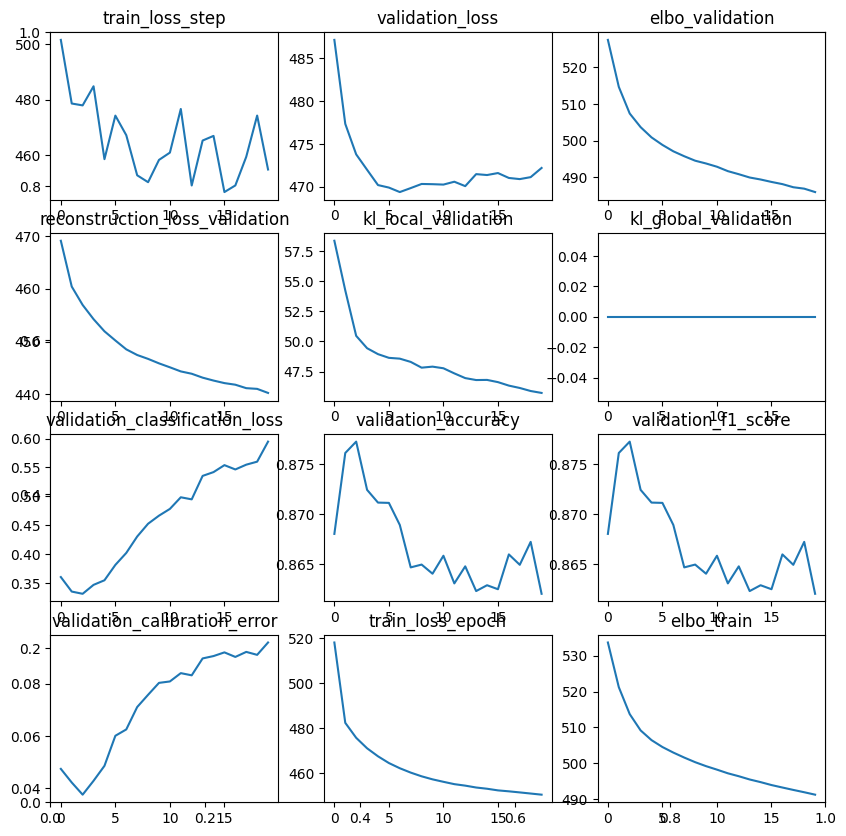

In [35]:
if run_scanvi==True:
    print("RUN SCANVI")
    def run_scvi(adata_hvg, max_epochs, batch_size_vae,CATEGORICAL_COV,PATIENCE=5, N_LATENT=10, N_LAYERS=1):
        DISPERSION =  'gene-batch'
        scvi.model.SCANVI.setup_anndata(adata_hvg, 
                                   #layer="counts",
                                   categorical_covariate_keys=CATEGORICAL_COV,
                                  #continuous_covariate_keys=CONTINUOUS_COV,
                                 batch_key=HVG_BATCH_KEY,
                                  labels_key=SCANVI_LABELS_KEY,
                                        unlabeled_category=SCANVI_UNLABELLED
                                       )
        model = scvi.model.SCANVI(adata_hvg, 
                        dispersion=DISPERSION,
                        n_latent = N_LATENT, 
                        n_layers = N_LAYERS,
                       )
        model.train(accelerator ='gpu', 
                    max_epochs=max_epochs,             
                    early_stopping=True,
                   early_stopping_patience=PATIENCE,
                   batch_size=batch_size_vae)
        print("model trained")
        try:
            count=1
            plt.subplots(figsize=(10, 10))
            for key in model.history.keys():
                plt.subplot(4,3,count)
                plt.plot(model.history[key])
                plt.title(key)
                count+=1
            plt.show()    
        except: 
            print("Error with count")
            try:
                print(count)
            except:
                print("can't print count")
        return adata_hvg, model
elif run_scanvi==False:
    print("RUN scvi")
    sample_key = "sample_id"
    def run_scvi(adata_hvg, max_epochs,  batch_size_vae, CATEGORICAL_COV, PATIENCE=5, N_LATENT=10, N_LAYERS=1):
        DISPERSION = 'gene-batch'
        scvi.model.SCVI.setup_anndata(adata_hvg, 
                              #        layer="counts",
                                        batch_key=HVG_BATCH_KEY,
                                       )
        model = scvi.model.SCVI(adata_hvg, 
                        dispersion=DISPERSION,
                        n_latent = N_LATENT, 
                        n_layers = N_LAYERS,
                       )
        model.train(max_epochs=max_epochs,             
                    early_stopping=True,
                    accelerator='gpu',
                   early_stopping_patience=PATIENCE, #use_gpu =True, 
                   batch_size=batch_size_vae)
        print("model trained")
        try:
            count=1
            plt.subplots(figsize=(10, 10))
            for key in model.history.keys():
                plt.subplot(4,3,count)
                plt.plot(model.history[key])
                plt.title(key)
                count+=1
            plt.show()    
        except: 
            print("Error with count")
            try:
                print(count)
            except:
                print("can't print count")
        return adata_hvg, model

adata, model_test = run_scvi(adata, 
                          max_epochs=MAX_EPOCHS, 
                      batch_size_vae=BATCH_SIZE,
                          CATEGORICAL_COV=CAT_COVS,
                   
                                       N_LATENT=N_LATENT,
                                      N_LAYERS=N_LAYERS,
                                        PATIENCE=EARLY_STOPPING_PATIENCE
                            )

# SAVE MODEL

In [36]:
if run_scanvi==True:
    BASE_DIR = BASE + f'/SpatialSkinAtlasMapping_scanviSpatialSkinAtlasMapping_{DATASET}_{model_details}/'
    model_test.save(BASE_DIR,
                save_anndata=True,
                 overwrite=True)
else:
    BASE_DIR = BASE + f'/SpatialSkinAtlasMapping_scvi_{DATASET}_{model_details}/'
    model_test.save(BASE_DIR,
                    save_anndata=True,
                 overwrite=True)
print(f"saved to {BASE_DIR}")

saved to /lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output//SpatialSkinAtlasMapping_scanviSpatialSkinAtlasMapping_CTCL_mm_FBS_HVGNUMBER1852__MAXEPOCHS20__BATCHKEYsample_id__COVStech/


# Now, we will re-load original data to cluster

In [37]:
# load data (pre-HVG selection)
print(f"trained. now re-load adata: {adata_path}")
adata=sc.read_h5ad(adata_path)

trained. now re-load adata: /lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output/adata_CTCL_mm_FBS_and_FBATLAS_preintegration.h5ad


In [38]:
# attach scanvi embeddings + predictions
latent = model_test.get_latent_representation() 
adata.obsm["X_scanvi"] = latent


try:
    adata.obs["scanvi_predictions"]=preds
except:
    try:
        preds = model_test.predict(adata)
        adata.obs["scanvi_predictions"]=preds
    except:
        1
    try:
        preds = model_test.predict()
        adata.obs["scanvi_predictions"]=preds
    except:
        1

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [39]:
import gc
gc.collect()

31289

#  knn -> umap -> save

In [40]:
# Note here that we include the atlas data in KNN construction. Alternatively this can be excluded, but we found
# good results through including it.
neighbor_id = f"neighbor_{NEIGHBOR}"   
print("start neighbours")
sc.pp.neighbors(adata, use_rep = 'X_scanvi', metric = "euclidean", n_neighbors=NEIGHBOR,key_added=neighbor_id)
print("neighbours done")
print("start umap")
sc.tl.umap(adata, min_dist=MIN_DIST, neighbors_key =neighbor_id )

start neighbours
neighbours done
start umap


In [41]:
# save to dir with model
SAVE_PATH = BASE_DIR + f'adata_{DATASET}_integrated.h5ad'
adata.write(SAVE_PATH,  compression="gzip")
print(f"Saved to {SAVE_PATH}")
from datetime import datetime
now = datetime.now()
timestamp = now.strftime("%Y-%m-%d %H:%M:%S")
print(f"Saved! Time: {timestamp}")
 

Saved to /lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output//SpatialSkinAtlasMapping_scanviSpatialSkinAtlasMapping_CTCL_mm_FBS_HVGNUMBER1852__MAXEPOCHS20__BATCHKEYsample_id__COVStech/adata_CTCL_mm_FBS_integrated.h5ad
Saved! Time: 2025-12-23 15:57:09


In [42]:
SAVE_PATH = BASE_DIR + f'adata_{DATASET}_integrated.h5ad'
adata.write(SAVE_PATH,  compression="gzip")

In [43]:
SAVE_PATH

'/lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output//SpatialSkinAtlasMapping_scanviSpatialSkinAtlasMapping_CTCL_mm_FBS_HVGNUMBER1852__MAXEPOCHS20__BATCHKEYsample_id__COVStech/adata_CTCL_mm_FBS_integrated.h5ad'

# Visualise output

In [44]:
adata

AnnData object with n_obs × n_vars = 286674 × 5000
    obs: 'sample_id', 'barcode', 'dataset_id', 'GSE', 'Site_status', 'Patient_status', 'DonorID', 'Location', 'Age', 'Sex', 'n_genes', 'OriginalAnnotation', 'Chemistry', 'lvl3_annotation', 'lvl2_annotation', 'lvl0_annotation', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid', 'leiden_res0.2', 'Site_status_binary', 'atlas_status_reynolds', 'atlas_status', 'Site_status2', 'Patient_status2', 'Sex_original', 'leiden_res1', 'test', 'corefb_names', 'lvl3_annotation_uncert', 'lvl3_annotation_pred', 'leiden_res0.5', 'merged_annotations', 'test3', 'test4', 'test5', 'test6', 'leiden_res0.7', 'test7', 'lvl3_annotation_pred2', 'test8', 'test9', 'test10', 'test11', 'disease_category', 'macfb', 'macfb2', 'test12', 'test13', 'test14', 'test15', 'tes

In [13]:
# PATH = '/lustre/scratch124/cellgen/haniffa/projects/adult_skin_v1/nobackup_output//SpatialSkinAtlasMapping_scanviSpatialSkinAtlasMapping_HS_FBs_HVGNUMBER1684__MAXEPOCHS20__BATCHKEYsample_id__COVStech/adata_HS_FBs_integrated.h5ad'
# adata=sc.read_h5ad(PATH)

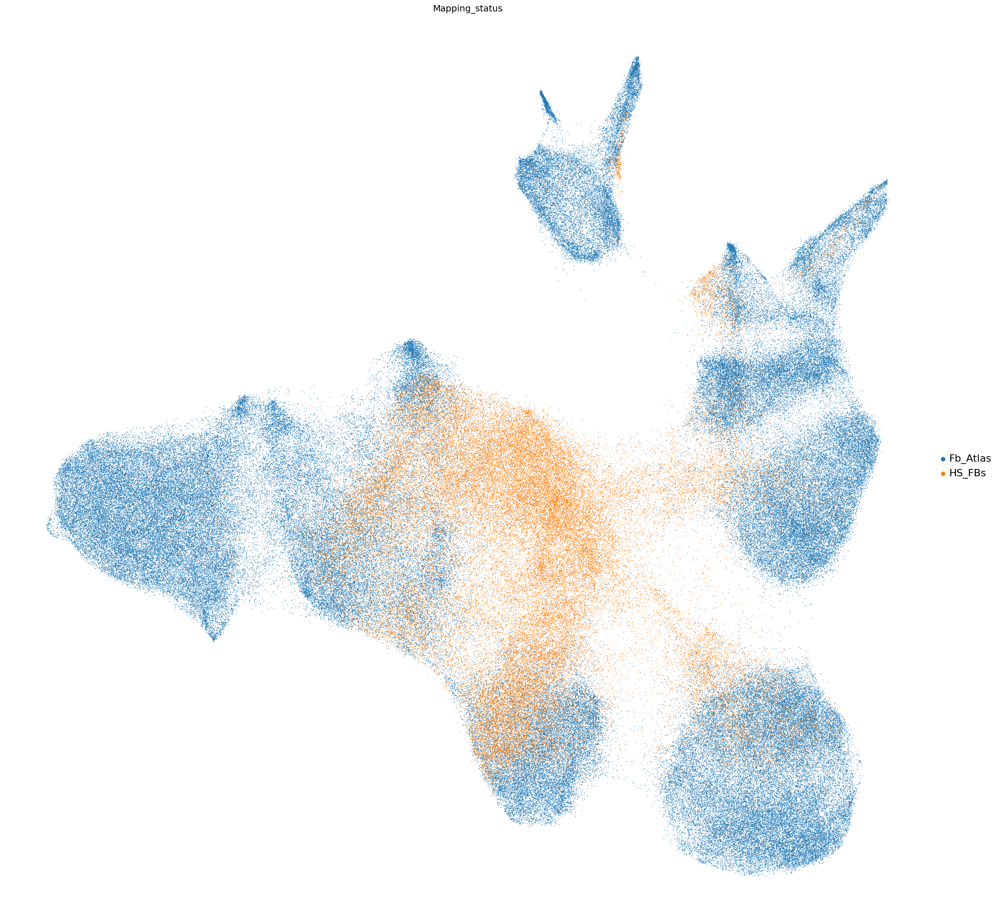

In [14]:
"""
Show how new data maps to atlas. 

"""

sc.settings.set_figure_params(dpi=50, dpi_save=300, facecolor="white", frameon=False, figsize=(26,26))

sc.pl.umap(
    adata,
    color=[
        'Mapping_status',  
    ],
    #legend_loc="on data",
    s=5, 
    legend_fontoutline=2,
    legend_fontsize=16,

#        palette = {
#     "SpatialSkinAtlas": "#E8E8E8",   
#     DATASET: "#6ECFF6"            # swaecation sky blue
# }         
)



In [15]:
!wget "https://raw.githubusercontent.com/haniffalab/spatial_skin_atlas/main/misc/color_for_adult_skin2.pkl" \
     -O color_for_adult_skin2.pkl

import pickle
file_path = "./color_for_adult_skin2.pkl"

with open(file_path, "rb") as f:
    colors = pickle.load(f)
colors= colors | {'New/unlabelled/excluded': "#C8C8C8"}
print(f"Loaded {len(colors)} colour entries")

--2026-01-08 12:49:58--  https://raw.githubusercontent.com/haniffalab/spatial_skin_atlas/main/misc/color_for_adult_skin2.pkl
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4369 (4.3K) [application/octet-stream]
Saving to: ‘color_for_adult_skin2.pkl’

color_for_adult_ski 100%[===================>]   4.27K  --.-KB/s    in 0s      

2026-01-08 12:49:58 (62.9 MB/s) - ‘color_for_adult_skin2.pkl’ saved [4369/4369]

Loaded 195 colour entries


In [16]:
custom_colors = {    'F1: Superficial': '#ffef5a',
    'F2/3: Perivascular': '#364f99',
    'F2: Universal': '#91bae2',
    'F3: FRC-like': '#c6508f',
    'F4: DP_HHIP+': '#c9efb4',
    'F4: DS_DPEP1+': '#3d6f3b',
    'F4: TNN+COCH+': '#00f273',
    'F5: NGFR+': '#8981a7',
    'F5: RAMP1+': '#9333EA',
     'F6: Inflammatory myofibroblast': "#75fbfd",
     'F7: Myofibroblast': "#2f6565",
       'F8: Fascia-like myofibroblast':"#EFA093", #'#dd7465',
 'F_Fascia': "#0000004D",
                 'New/unlabelled/excluded': "#C8C8C8"
                               }

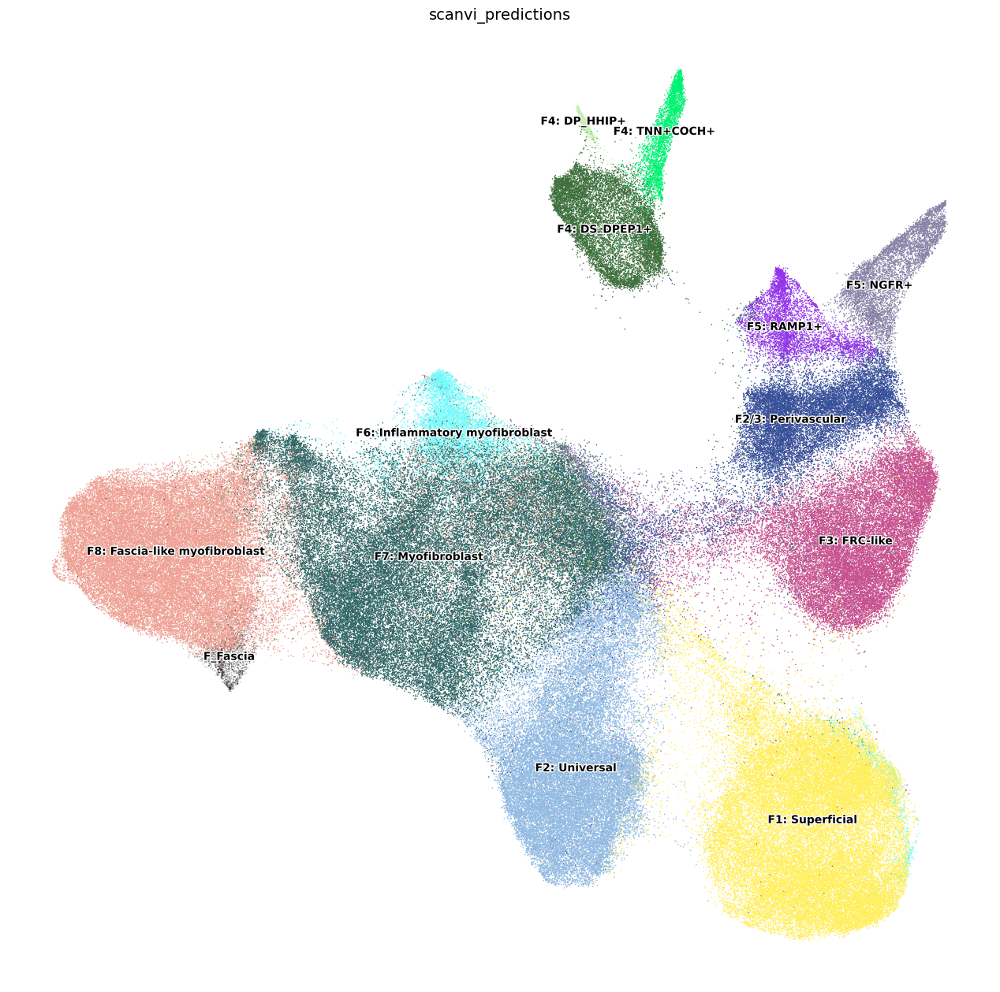

In [17]:
"""
We can also see what scanvi predictions are, but in my experience these have not been too reliable
compared to maanually annotating the data.

However, not too bad for a quick overview.
"""


sc.settings.set_figure_params(dpi=50, dpi_save=300, facecolor="white", frameon=False, figsize=(16,16))
adata_spatial = adata[adata.obs["Mapping_status"]!="SpatialSkinAtlas"].copy()
try:
    sc.pl.umap(
        adata_spatial,
        color=[
            'scanvi_predictions',  
        ],
        legend_loc="on data",
        s=5, 
        legend_fontoutline=2,
        legend_fontsize=10,
        palette=custom_colors

    )
except:
    sc.pl.umap(
        adata_spatial,
        color=[
            'scanvi_predictions',  
        ],
        legend_loc="on data",
        s=5, 
        legend_fontoutline=2,
        legend_fontsize=10,

    )


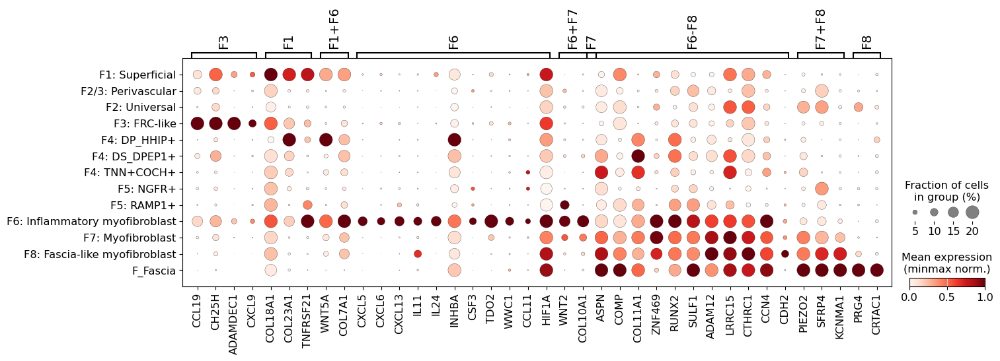

In [18]:


LESIONAL_GENES_VSHORT5 = {
    "F3": [
        "CCL19",
        "CD74",
        "CH25H",
        "ADAMDEC1",
        "CXCL9"
    ],
    "F1": [
        "COL18A1",
        "COL23A1",
        "COL13A1",
        "NKD2",
        "CRABP1",
        "TNFRSF21",
        "CXCL1"
    ],
    "F1+F6": [
        "WNT5A",
        "COL7A1"
    ],
    "F6": [
        "CXCL8",
        "CXCL5",
        "CXCL6",
        "CXCL13",
        "IL11",
        "IL24",
        "MMP1",
        "MMP3",
        "IL7R",
        "INHBA",
        "CSF3",
        "TDO2",
        "WWC1",
        "CHI3L1",
        "CCL5",
        "CCL11",
        "FAM167A",
        "HIF1A"
    ],
    "F6+F7": [
        "WNT2",
        "COL10A1",
        "LAMP5"
    ],
    "F7": [
        "NRG1",
        "OGN"
    ],
    "F6-F8": [
        "ACTA2",
        "TAGLN",
        "ASPN",
        "COMP",
        "COL11A1",
        "KIF26B",
        "ZNF469",
        "RUNX2",
        "SULF1",
        "ADAM12",
        "ADAM19",
        "COL8A1",
        "LRRC15",
        "CREB3L1",
        "CTHRC1",
        "CCN4",
        "FABP5",
        "CDH2"
    ],
    "F7+F8": [
        "C1QTNF3",
        "CADM1",
        "LRRC17",
        "PIEZO2",
        "SFRP4",
        "KCNMA1"
    ],
    "F8": [
        "ACAN",
        "SCX",
        "THBS4",
        "ITGA10",
        "FGF18",
        "PRG4",
        "CRTAC1"
    ]
}


def remove_markers(LIST):
    try: 
        LIST = {key: [gene for gene in genes if gene in adata_spatial.var_names] 
                           for key, genes in LIST.items()}
    except: 
        LIST =[gene for gene in LIST if gene in adata_spatial.var_names]
    return LIST


sc.pl.dotplot(
    adata_spatial,
    remove_markers(LESIONAL_GENES_VSHORT5),
    groupby="scanvi_predictions",
    standard_scale="var",
    dendrogram=False,
    vmax=1,
                               colorbar_title="Mean expression\n(minmax norm.)",
    dot_max=0.2 # typically reduce to 0,3 to account for lower sensitivity with xenium
    #categories_order = ["Merkel cell", "ILC1", "ILC3", "ILC2"],
                                  #  save="misc_scrna.pdf"

) 


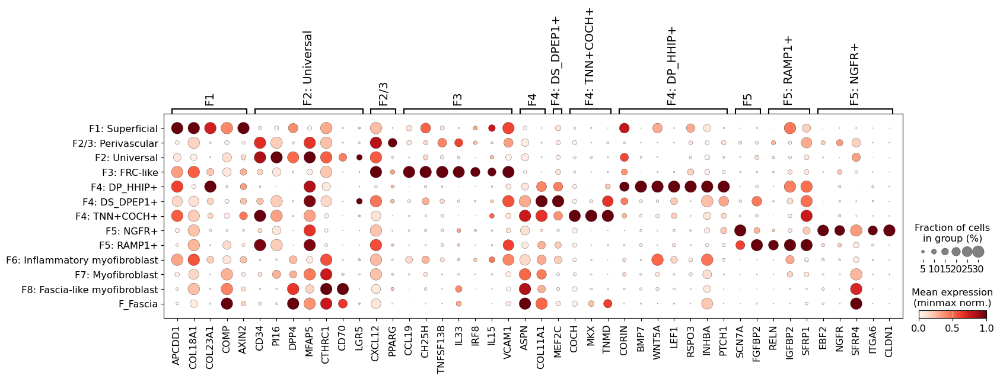

In [19]:
reynolds_short_final = {       
    "F1":[   "APCDD1",   "COL18A1",  "COL23A1",   "COL13A1",  "COMP",  
                                          "NKD2","RSPO1",  "AXIN2" , "WIF1",'SFRP2',
                                          #"HSPB3", 
                                   ],
    
                                    
                   
    "F2: Universal": ['CD34',
  'PI16',    'DPP4', 'MFAP5', 'PCOLCE2' , 'CTHRC1',   'SLPI',#  "TSPAN8",#'MATN4',
              #"CD24",  
           "CD70", "LGR5",#"KLF4"
              ],
      'F2/3': ['CXCL12', 'APOE', 'EFEMP1', #'GGT5', 
                                    "APOC1", "C7", "PLA2G2A", 'PPARG', #"CD36",
                                          #'IL1RL1', 'MARCH3', 'PCSK1', 
                                          
                                          
                                          # "FMO1", 
                                          
                                   # "PPARG", "TNFSF14"
                           "MYOC", "GDF10", # "LINC-PINT", 
                             # "POU3F3", 
                                  # "TNNT3", 
                    ],
 'F3': ['CCL19',"CD74" ,  'CH25H',  "TNFSF13B",  'IL33', "IRF8" ,#"COX4I2", 
       # "IL7",
        "IL15",
        "VCAM1", "HLA-DRA", "HLA-DRB1",# "CCL11","CCL7", "CCL2",
        
        #"ICAM1", 
        #'CX3CL1', 'ACHE', 'CCL8', 
 
           ], 
      

                           #     "EXTRA_F1": [   'COL23A1', 'CLEC2A', 'AXIN2', 'TNFRSF19', 'NTM', 'PLCB4', 'MYO10', 'RSPO1', 'COL6A5', 'AHRR', 'ESRRG', 'FREM1', 'UNC13C',
                            #       ],
               #   "F*": ['PLIN2', 'CEMIP' , 'ISG20', 'MMP1'], 
#"Palmoplantar": ["CRTAC1",# "HOXA13", "CILP2", #"F5",
#                 "SCX", "SOX5",  ], #"CDH13", "HPSE2", "CROCC", "CRTAC1", "CRLF1", "SCX", "LRFN5",

                   
                    "F4": ["ASPN", 'COL11A1',],          
 'F4: DS_DPEP1+': ['MEF2C', 
  'DPEP1',
  "MYL4", 
  #'PPP1R14A',
 # 'POSTN',
],
 'F4: TNN+COCH+': [
     #'PTGDS',
  #'OGN',
  'TNN',
  'COCH',
  'CRABP1',
  'COL24A1',"RSPO4","SLITRK6",# "CCK", 
     'NRG3', 'MKX', 'TNMD', # 'SCX'
          ],
    "F4: DP_HHIP+": ["CORIN", 
        #"INHBA", 
         "BMP7", "WNT5A", 'LEF1',
        #"SOX18", #"BAMBI", 
        "HHIP", #"RSPO2", 
        "RSPO3", "INHBA",#"ALPL",
      #  "DIO2", 
        "PTCH1", #"COL23A1", #'SOX2', 
       # 'PI15', "S100B",
           ],
        "F5": [  "SCN7A" ,"FMO2",   "FGFBP2","OLFML2A","PEAR1", # "PDGFRB", #"TAC1" 
              ],
         
                      "F5: RAMP1+": ["RAMP1", "RELN", 'PLEKHA6',  "IGFBP2", 'SFRP1', #"COL26A1", #"TAC1"
                                   ], #"CPE", "PTN", "IGF1", 

 'F5: NGFR+': [  'EBF2', "NGFR",  'SFRP4',# "TENM2", #"TM4SF1", "ANGPTL7",  
               "ITGA6", "CDH19",  "CLDN1" ,#"FOXS1", #"SOX17",
                 #"CAVIN2", "SFRP5", #"TNNC1"
                
                     ],
 
}
sc.pl.dotplot(
    adata_spatial,
    remove_markers(reynolds_short_final),
    groupby="scanvi_predictions",
    standard_scale="var",
    dendrogram=False,
    vmax=1,
                               colorbar_title="Mean expression\n(minmax norm.)",
    dot_max=0.3 # typically reduce to 0,3 to account for lower sensitivity with xenium
    #categories_order = ["Merkel cell", "ILC1", "ILC3", "ILC2"],
                                  #  save="misc_scrna.pdf"

) 


In [56]:
"""
let's colour a section 
by these cell types to show how we can use this info to
get an idea of skin composition at high-resolution
"""

"\nlet's colour a section \nby these cell types to show how we can use this info to\nget an idea of skin composition at high-resolution\n"

In [59]:
adata_spatial.obs.tech.value_counts()

tech
xenium    95918
Name: count, dtype: int64

In [61]:
adata_sample0

AnnData object with n_obs × n_vars = 14211 × 5000
    obs: 'sample_id', 'barcode', 'dataset_id', 'GSE', 'Site_status', 'Patient_status', 'DonorID', 'Location', 'Age', 'Sex', 'n_genes', 'OriginalAnnotation', 'Chemistry', 'lvl3_annotation', 'lvl2_annotation', 'lvl0_annotation', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'QC_hi', 'QC_mid', 'leiden_res0.2', 'Site_status_binary', 'atlas_status_reynolds', 'atlas_status', 'Site_status2', 'Patient_status2', 'Sex_original', 'leiden_res1', 'test', 'corefb_names', 'lvl3_annotation_uncert', 'lvl3_annotation_pred', 'leiden_res0.5', 'merged_annotations', 'test3', 'test4', 'test5', 'test6', 'leiden_res0.7', 'test7', 'lvl3_annotation_pred2', 'test8', 'test9', 'test10', 'test11', 'disease_category', 'macfb', 'macfb2', 'test12', 'test13', 'test14', 'test15', 'test

In [71]:
adata_tomap

AnnData object with n_obs × n_vars = 95918 × 5000
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'segmentation_method', 'fine_celltypes', 'broad_celltypes', 'Disease', 'leiden_clustering0.3', 'leiden_clustering0.1', 'leiden_clustering0.5', 'leiden_clustering1', 'fine_celltypes3', 'fine_celltypes2', 'region', 'leiden_clustering0.3_names', 'celltype', 'broad_annotation', 'fine_annotation', 'sample_id', 'barcode', 'GSE', 'Site_status', 'Patient_status', 'Location', 'Age', 'Sex', 'dataset_id', 'lvl5_annotation', 'atlas_status', 'atlas_status_reynolds', 'Timepoint', 'info_id6', 'tech', 'scanvi_predictions2', 'lvl1_new', 'Site_status_binary2', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'sample_id_dir', 'patient_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'p

In [20]:
adata_spatial.obsm["spatial"] = (
    adata_spatial.obs[["x_centroid", "y_centroid"]]
    .astype(float)
    .to_numpy()
)

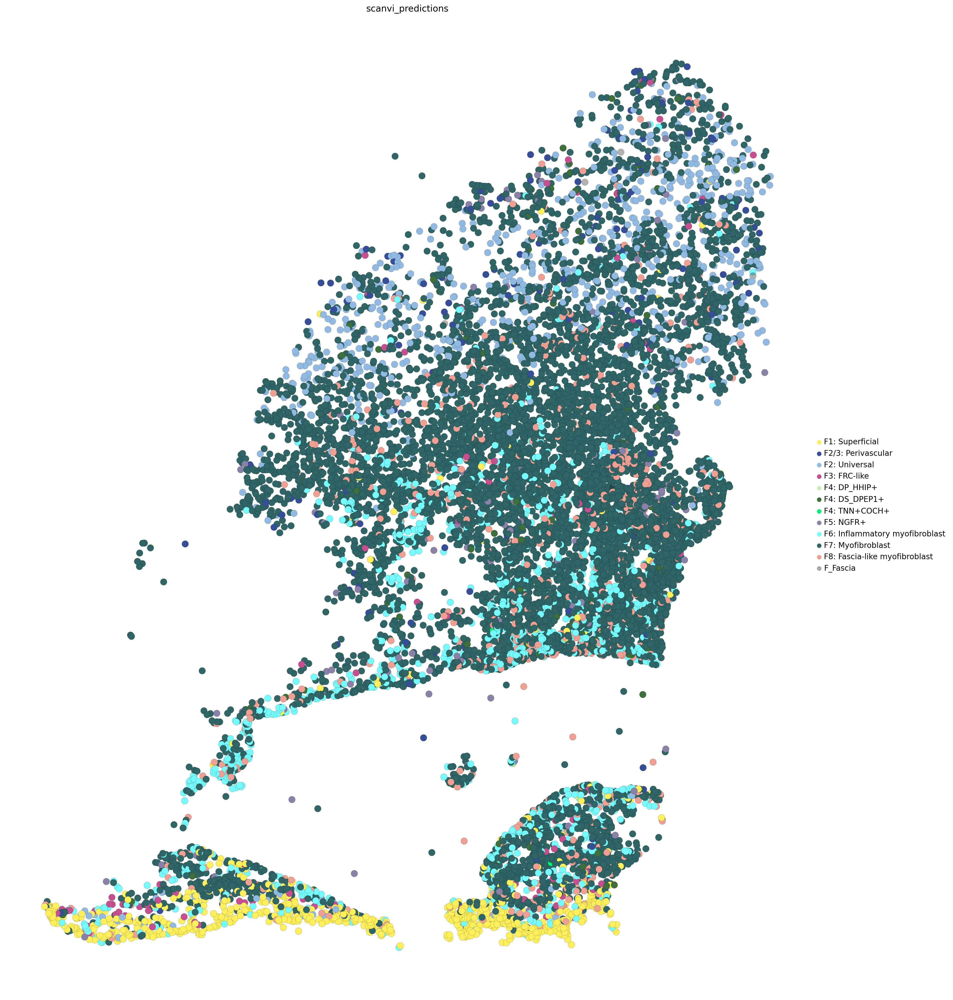

In [21]:
sc.settings.set_figure_params(dpi=100,  dpi_save=300, facecolor="white", frameon=False, figsize=(28,28))
SAMPLE=adata_spatial.obs["sample_id"].value_counts().index[0]

adata_sample0 = adata_spatial[adata_spatial.obs["sample_id"]==SAMPLE].copy()
sc.pl.spatial(
    adata_sample0,
    color="scanvi_predictions",
    spot_size=40,
    vmax=1,
    #legend_loc="on data",
    edgecolor="black",
    linewidth=0.1,
            legend_fontsize=12,
    palette=custom_colors
    #ax=ax,
    #legend_loc="on data"  # Disable the legend for each subplot
)
 
 